In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import os
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import time

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.metrics import accuracy_score, f1_score, classification_report

np.seterr(over='ignore')

In [4]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
import mlrose

What is an optimization problem? 

- We aim to find the best state, according to some objective function. 
- An example of a state is the weights used in a machine learning model, such as a neural network
- State is represented by a one-dimensional vector 
- "Best" state is defined using the Cost Function/Fitness Function/Objective Function 
- Function takes in a State Array as Input and returns a Fitness Value as Output


We will make 3 steps to solve an optimization problem with mlrose:
 - 1) Define fitness function object
 - 2) Define an optimization problem object
 - 3) Select and run a randomized optimization algorithm

Variables to Modify: 

All of them: 
   - max_iters
   - max_attempts 
    
RHC: 
   - init_state: discrete 
   - restarts: default 0, range variable  
    
SA: 
   - init_state: discrete
   - schedule: Exponential, Geometric, Arithmetic
    
GA: 
   - pop_size: default 200, range variable  
   - mutation_prob: default 0.1, range (0,1)
    
Mimic: 
   - pop_size: default: 200, range variable 
   - keep_pct: default 0.2, range (0,1)

#### Tutorial - Machine Learning Weight Optimization Problems 

 Steps to Neural Network  Weight Optimization Problem 
 
 - 1) Initialize a ML weight optimization problem object
 - 2) Find optimal weights for a given training dataset by calling the fit method of object init in step 1 
 - 3) Predict labels for test dataset calling the predict method of obj from step 1

In [5]:
from sklearn.datasets import load_iris

In [6]:
# data is a dictionary
data = load_iris()

In [7]:
data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [8]:
print(data.data[0])

[5.1 3.5 1.4 0.2]


In [9]:
print(data.feature_names)

['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']


In [10]:
print(data.target[0])

0


In [11]:
print(data.target_names[data.target[0]])

setosa


In [12]:
print(np.unique(data.target))

[0 1 2]


In [13]:
print(data.target_names[0])
print(data.target_names[1])
print(data.target_names[2])

setosa
versicolor
virginica


In [14]:
## Prep Data 
X_Train, X_Test, Y_Train, Y_Test = train_test_split(data.data, data.target, 
                                                   test_size = 0.2, random_state = 3)

# Normalize Feature Data 
scaler = MinMaxScaler()

X_Train_Scaled = scaler.fit_transform(X_Train)
X_Test_Scaled = scaler.fit_transform(X_Test)

# One Hot Encode Target Values 
one_hot = OneHotEncoder()

Y_Train_Hot = one_hot.fit_transform(Y_Train.reshape(-1,1)).todense()
Y_Test_Hot = one_hot.fit_transform(Y_Test.reshape(-1,1)).todense()


Make Neural Network

##### Random Hill Climb

In [15]:
nn_model1 = mlrose.NeuralNetwork(hidden_nodes = [2], activation = 'relu',
                                algorithm = 'random_hill_climb', max_iters=1000,
                                bias = True, is_classifier = True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100, 
                                random_state = 3)

nn_model1.fit(X_Train_Scaled, Y_Train_Hot)

NeuralNetwork(clip_max=5, early_stopping=True, hidden_nodes=[2],
              learning_rate=0.0001, max_iters=1000)

Use Neural Network to Predict on Test and Train data

In [16]:
# predict labels for Training Set 
Y_Train_Pred = nn_model1.predict(X_Train_Scaled)

Y_Train_Accuracy = accuracy_score(Y_Train_Hot, Y_Train_Pred)

print(Y_Train_Accuracy)

#predict labels for Testing Set 
Y_Test_Pred = nn_model1.predict(X_Test_Scaled)

Y_Test_Accuracy = accuracy_score(Y_Test_Hot, Y_Test_Pred)

print(Y_Test_Accuracy)

0.45
0.5666666666666667


##### Gradient Descent - same as BackPropogation, similar to Sklearn

In [17]:
nn_model2 = mlrose.NeuralNetwork(hidden_nodes = [2], activation = 'relu',
                                algorithm = 'gradient_descent', max_iters=1000,
                                bias = True, is_classifier = True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100, 
                                random_state = 3)

nn_model2.fit(X_Train_Scaled, Y_Train_Hot)

NeuralNetwork(clip_max=5, early_stopping=True, hidden_nodes=[2],
              learning_rate=0.0001, max_iters=1000)

In [18]:
# predict labels for Training Set 
Y_Train_Pred = nn_model2.predict(X_Train_Scaled)

Y_Train_Accuracy = accuracy_score(Y_Train_Hot, Y_Train_Pred)

print(Y_Train_Accuracy)

#predict labels for Testing Set 
Y_Test_Pred = nn_model2.predict(X_Test_Scaled)

Y_Test_Accuracy = accuracy_score(Y_Test_Hot, Y_Test_Pred)

print(Y_Test_Accuracy)

0.625
0.6333333333333333


##### Simulated Annealing

In [ ]:
schedule = mlrose.GeomDecay()
nn_model3 = mlrose.NeuralNetwork(hidden_nodes = [2], activation = 'relu',
                                algorithm = 'simulated_annealing', max_iters=1000,
                                bias = True, is_classifier = True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100, 
                                random_state = 3,
                                schedule = schedule)

nn_model3.fit(X_Train_Scaled, Y_Train_Hot)

In [ ]:
# predict labels for Training Set 
Y_Train_Pred = nn_model3.predict(X_Train_Scaled)

Y_Train_Accuracy = accuracy_score(Y_Train_Hot, Y_Train_Pred)

print(Y_Train_Accuracy)

#predict labels for Testing Set 
Y_Test_Pred = nn_model3.predict(X_Test_Scaled)

Y_Test_Accuracy = accuracy_score(Y_Test_Hot, Y_Test_Pred)

print(Y_Test_Accuracy)

##### Genetic Algorithm

In [ ]:
nn_model4 = mlrose.NeuralNetwork(hidden_nodes = [2], activation = 'relu',
                                algorithm = 'genetic_alg', max_iters=1000,
                                bias = True, is_classifier = True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100, 
                                random_state = 3,
                                pop_size=200)

nn_model4.fit(X_Train_Scaled, Y_Train_Hot)

In [ ]:
# predict labels for Training Set 
Y_Train_Pred = nn_model4.predict(X_Train_Scaled)

Y_Train_Accuracy = accuracy_score(Y_Train_Hot, Y_Train_Pred)

print(Y_Train_Accuracy)

#predict labels for Testing Set 
Y_Test_Pred = nn_model4.predict(X_Test_Scaled)

Y_Test_Accuracy = accuracy_score(Y_Test_Hot, Y_Test_Pred)

print(Y_Test_Accuracy)

TODO: read this documentation, try each algo: https://mlrose.readthedocs.io/en/stable/source/neural.html

In [ ]:
nn_model4.fitted_weights

In [ ]:
nn_model4.loss

In [ ]:
print(nn_model1.loss)
print(nn_model2.loss)
print(nn_model3.loss)
print(nn_model4.loss)

### Data Import

In [21]:
data_polling = pd.read_stata("Data/cumulative_2006_2018.dta")

In [22]:
inputs = ['year','st','gender', 'age', 'race', 'hispanic', 'educ', 'faminc', 'marstat', 'economy_retro', 'newsint','approval_pres']
targets = ['pid3']

keep = inputs + targets

data_polling = data_polling[(data_polling.year == 2018) & (data_polling.pid3.isin(['Democrat','Republican']) )]

polling = data_polling[keep]


In [23]:
polling.dropna(axis=0, how='any',inplace=True)

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [24]:
pd.options.mode.chained_assignment = None  # default='warn'

polling['age_band'] = np.NaN
polling.loc[ (polling['age'] >= 18) & (polling['age'] <= 29), 'age_band'] = 'Young'
polling.loc[ (polling['age'] >= 30) & (polling['age'] <= 49), 'age_band'] = 'Lower-Middle'
polling.loc[ (polling['age'] >= 50) & (polling['age'] <= 69), 'age_band'] = 'Upper-Middle'
polling.loc[ (polling['age'] >= 70) , 'age_band'] = 'Old'

In [25]:
polling.loc[ polling['pid3'] == "Democrat", "Dem_Ind"] = 1
polling.loc[ polling['pid3'] == 'Republican', "Dem_Ind"] = 0
polling['Dem_Ind'] = polling['Dem_Ind'].astype(int)

In [26]:
categorical_polling = ['st','gender', 'age_band', 'race', 'hispanic', 'educ', 'faminc', 'marstat', 'economy_retro', 'newsint','approval_pres']


In [27]:
polling.head()

,year,st,gender,age,race,hispanic,educ,faminc,marstat,economy_retro,newsint,approval_pres,pid3,age_band,Dem_Ind
392756,2018,OH,Female,58,White,No,Post-Grad,150k+,Married,Stayed About The Same,Only Now And Then,Approve / Somewhat Approve,Republican,Upper-Middle,0
392757,2018,KY,Female,66,White,No,Post-Grad,10k - 20k,Divorced,Stayed About The Same,Most Of The Time,Strongly Disapprove,Democrat,Upper-Middle,1
392758,2018,AZ,Female,88,White,No,High School Graduate,20k - 30k,Widowed,Gotten Much Better,Some Of The Time,Approve / Somewhat Approve,Republican,Old,0
392760,2018,NC,Male,71,White,No,High School Graduate,50k - 60k,Married,Gotten Much Better,Some Of The Time,Strongly Approve,Republican,Old,0
392761,2018,PA,Male,86,White,No,4-Year,60k - 70k,Widowed,Gotten Better / Somewhat Better,Most Of The Time,Strongly Approve,Republican,Old,0


In [28]:
small_polling = polling.sample(n=10000, random_state = 42)

In [29]:
X_polling = small_polling[categorical_polling]

y_polling = small_polling.loc[:,'Dem_Ind']


#### Dataset #2

In [132]:
# Originall Retrieved From: http://archive.ics.uci.edu/ml/datasets/Adult
# CSV Retrieved From: https://www.kaggle.com/uciml/adult-census-income
# URL: https://drive.google.com/file/d/1wuWJPeacMhHQSXdITZx1_pktoU-ZRb8n/view?usp=sharing
data_income = pd.read_csv("Data/adult.csv")

print(data_income.shape)

data_income.head()

(32561, 15)


,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [133]:
# Response Variable 
data_income.loc[ data_income['income'] == ">50K", "income"] = 1
data_income.loc[ data_income['income'] == '<=50K', "income"] = 0
data_income['income'] = data_income['income'].astype(int)

<AxesSubplot:>

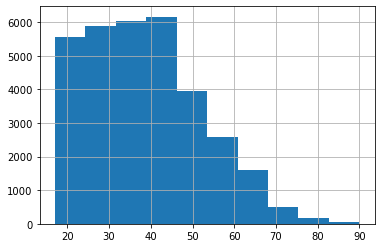

In [134]:
# Feature Engineering
data_income['native_USA'] = 0 
data_income.loc[ data_income['native.country'] == "United-States", "native_USA"] = 1
data_income.loc[ data_income['native.country'] != "United-States", "native_USA"] = 0

data_income.age.hist()

<AxesSubplot:>

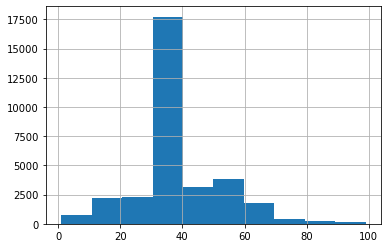

In [135]:
data_income['age_band'] = np.NaN
data_income.loc[ (data_income['age'] <= 29), 'age_band'] = 'Young'
data_income.loc[ (data_income['age'] >= 30) & (data_income['age'] <= 49), 'age_band'] = 'Lower-Middle'
data_income.loc[ (data_income['age'] >= 50) & (data_income['age'] <= 69), 'age_band'] = 'Upper-Middle'
data_income.loc[ (data_income['age'] >= 70) , 'age_band'] = 'Old'

data_income['age_band'].value_counts()

data_income['hours.per.week'].hist()

In [136]:
data_income['hours_band'] = np.NaN
data_income.loc[ (data_income['hours.per.week']) < 40, "hours_band"] = 'Low'
data_income.loc[ (data_income['hours.per.week']) == 40, "hours_band"] = 'Average'
data_income.loc[ (data_income['hours.per.week']) > 40, "hours_band"] = 'High'

data_income['native_USA'].value_counts()

data_income['hours_band'].value_counts()

data_income.columns

categorical_income = ['workclass','education','marital.status','occupation','relationship','race','sex','native_USA','age_band','hours_band']


data_income['income'].value_counts()

data_income.head()

small_income = data_income.sample(10000,random_state=42)

X_income = small_income[categorical_income]

y_income = small_income.loc[:,'income']

General Use Functions

In [30]:
from sklearn.preprocessing import OneHotEncoder

def prep_data(X, y, categoricalVars):

    encoder = OneHotEncoder(sparse=False)
    X_encoded = pd.DataFrame(encoder.fit_transform(X[categoricalVars]))
    X_encoded.columns = encoder.get_feature_names(categoricalVars)
    X.drop(categoricalVars, axis = 1, inplace = True)
    if X.shape[1] > 0:
        OH_X = pd.concat([X, pd.DataFrame(X_encoded, index=X.index)], axis = 1)
    else:
        OH_X = X_encoded 
        
    X_Train, X_Test, Y_Train, Y_Test = train_test_split(OH_X, y, test_size = .30, train_size = .70, random_state = 42)
    return(X_Train, X_Test, Y_Train, Y_Test)

In [31]:
X_Train_Polling, X_Test_Polling, Y_Train_Polling, Y_Test_Polling = prep_data(X_polling, y_polling, categorical_polling)


In [137]:
X_Train_Income, X_Test_Income, Y_Train_Income, Y_Test_Income = prep_data(X_income, y_income, categorical_income)


##### BackPropogation - Baseline from Prior Assignment

In [145]:
nn_backprop_1 = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                algorithm = 'gradient_descent', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.01,
                                early_stopping = False, 
                                clip_max = 5, max_attempts = 100,
                                random_state = 42, curve = True)

nn_backprop_1.fit(X_Train_Polling, Y_Train_Polling) # takes np array init weights, must equal number of nodes 

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

NeuralNetwork(clip_max=5, hidden_nodes=[156], learning_rate=0.01,
              max_iters=2000)

In [146]:
# predict labels for Training Set 
Y_Train_Pred = nn_backprop_1.predict(X_Train_Polling)

Y_Train_Accuracy = accuracy_score(Y_Train_Polling, Y_Train_Pred)
Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)

print("Polling, Train Accuracy: ",Y_Train_Accuracy)
print("Polling, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_backprop_1.predict(X_Test_Polling)

Y_Test_Accuracy = accuracy_score(Y_Test_Polling, Y_Test_Pred)
Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)

print()
print("Polling, Test Accuracy: ", Y_Test_Accuracy)
print("Polling, Test F1 Scores: ", Y_Test_F1_Score)

print (classification_report(Y_Test_Polling, Y_Test_Pred))

Polling, Train Accuracy:  0.48
Polling, Train F1 Score:  0.3969516235917827

Polling, Test Accuracy:  0.485
Polling, Test F1 Scores:  0.3876337693222354
              precision    recall  f1-score   support

           0       0.44      0.75      0.56      1294
           1       0.60      0.29      0.39      1706

    accuracy                           0.48      3000
   macro avg       0.52      0.52      0.47      3000
weighted avg       0.53      0.48      0.46      3000



In [147]:
len(nn_backprop_1.fitness_curve)

2000

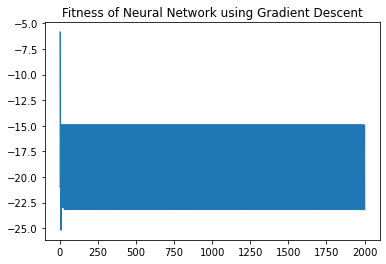

In [148]:
x = np.arange(1, 2001, 1)
y = nn_backprop_1.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using Gradient Descent")
plt.show()

Data 1 with better learning rate, to match results from A1

In [154]:
nn_backprop_1 = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                algorithm = 'gradient_descent', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.0001,
                                early_stopping = False, 
                                clip_max = 5, max_attempts = 100,
                                random_state = 42, curve = True)

nn_backprop_1.fit(X_Train_Polling, Y_Train_Polling) # takes np array init weights, must equal number of nodes 

NeuralNetwork(clip_max=5, hidden_nodes=[156], learning_rate=0.0001,
              max_iters=2000)

In [155]:
# predict labels for Training Set 
Y_Train_Pred = nn_backprop_1.predict(X_Train_Polling)

Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
print("Polling, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_backprop_1.predict(X_Test_Polling)

Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
print()
print("Polling, Test F1 Scores: ", Y_Test_F1_Score)

print (classification_report(Y_Test_Polling, Y_Test_Pred))

Polling, Train F1 Score:  0.9285445183975889

Polling, Test F1 Scores:  0.9215514727325751
              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1294
           1       0.92      0.93      0.92      1706

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.91      0.91      0.91      3000



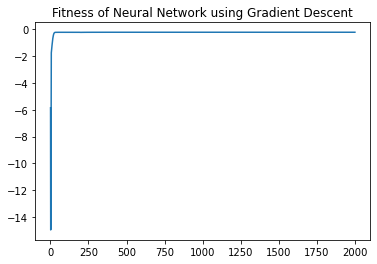

In [156]:
x = np.arange(1, 2001, 1)
y = nn_backprop_1.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using Gradient Descent")
plt.show()

In [ ]:
learning_rate

In [ ]:
learning_rate = [0.0001, 0.001, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

for num in learning_rate:
    
    print("learning rate:",num)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'gradient_descent', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = num,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True)

    nn_rhc.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

Data 2

In [138]:
nn_backprop_2 = mlrose.NeuralNetwork(hidden_nodes = [1], activation = 'tanh',
                                algorithm = 'gradient_descent', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.05,
                                early_stopping = False, 
                                clip_max = 5, max_attempts = 100,
                                random_state = 42, curve = True)

nn_backprop_2.fit(X_Train_Income, Y_Train_Income) # takes np array init weights, must equal number of nodes 

NeuralNetwork(clip_max=5, hidden_nodes=[1], learning_rate=0.05, max_iters=2000)

In [139]:
# predict labels for Training Set 
Y_Train_Pred = nn_backprop_2.predict(X_Train_Income)

Y_Train_F1_Score = f1_score(Y_Train_Income, Y_Train_Pred)

print("Income, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_backprop_2.predict(X_Test_Income)

Y_Test_F1_Score = f1_score(Y_Test_Income, Y_Test_Pred)

print()
print("Income, Test F1 Scores: ", Y_Test_F1_Score)

print (classification_report(Y_Test_Income, Y_Test_Pred))

Income, Train Accuracy:  0.6852857142857143
Income, Train F1 Score:  0.24008278716798895

Income, Test Accuracy:  0.677
Income, Test F1 Scores:  0.2447388932190179
              precision    recall  f1-score   support

           0       0.77      0.83      0.79      2268
           1       0.28      0.21      0.24       732

    accuracy                           0.68      3000
   macro avg       0.53      0.52      0.52      3000
weighted avg       0.65      0.68      0.66      3000



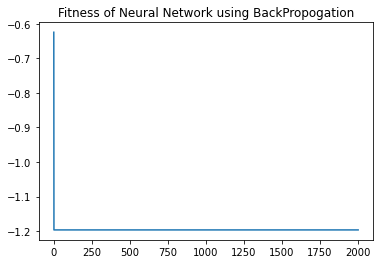

In [140]:
x = np.arange(1, 2001, 1)
y = nn_backprop_2.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using BackPropogation")
plt.show()

###### Random Hill Climbing

In [151]:
nn_rhc_1 = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                algorithm = 'random_hill_climb', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100,
                                random_state = 42, curve=True,
                                restarts = 0 )

nn_rhc_1.fit(X_Train_Polling, Y_Train_Polling)

NeuralNetwork(clip_max=5, early_stopping=True, hidden_nodes=[156],
              learning_rate=0.0001, max_iters=2000)

In [153]:
# predict labels for Training Set 
Y_Train_Pred = nn_rhc_1.predict(X_Train_Polling)

Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)

print("Polling, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_rhc_1.predict(X_Test_Polling)

Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)

print()
print("Polling, Test F1 Scores: ", Y_Test_F1_Score)

Polling, Train F1 Score:  0.3972171608414775

Polling, Test F1 Scores:  0.3876337693222354


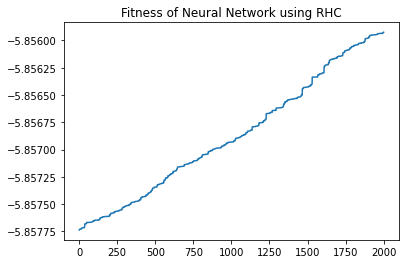

In [152]:
x = np.arange(1, 2001, 1)
y = nn_rhc_1.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using RHC")
plt.show()

Restarts

In [161]:
restarts = [1, 5, 10, 10]

for num in restarts:
    
    print("restarts:",num)
    nn_rhc = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'random_hill_climb', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = 0.0001,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    restarts = int(num),
                                    )

    nn_rhc.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn_rhc.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn_rhc.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

restarts: 1
Polling, Train F1 Score:  0.3972171608414775

Polling, Test F1 Scores:  0.3876337693222354
restarts: 5
Polling, Train F1 Score:  0.3974826101358065

Polling, Test F1 Scores:  0.3876337693222354
restarts: 10
Polling, Train F1 Score:  0.3972171608414775

Polling, Test F1 Scores:  0.3876337693222354
restarts: 10
Polling, Train F1 Score:  0.3972171608414775

Polling, Test F1 Scores:  0.3876337693222354


learning rate

In [165]:
learning_rate = [0.0001, 0.001, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

for num in learning_rate:
    
    print("learning rate:",num)
    nn_rhc = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'random_hill_climb', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = num,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    restarts = 1)

    nn_rhc.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn_rhc.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn_rhc.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

learning rate: 0.0001
Polling, Train F1 Score:  0.3972171608414775

Polling, Test F1 Scores:  0.3876337693222354
learning rate: 0.001
Polling, Train F1 Score:  0.3992068737607402

Polling, Test F1 Scores:  0.3905138339920948
learning rate: 0.01
Polling, Train F1 Score:  0.41162149001785425

Polling, Test F1 Scores:  0.4040325707638619
learning rate: 0.05
Polling, Train F1 Score:  0.4682395644283121

Polling, Test F1 Scores:  0.46886184681460275
learning rate: 0.1
Polling, Train F1 Score:  0.5290088074933594

Polling, Test F1 Scores:  0.5318376773342132


##### Simulated Annealing

In [75]:
nn_sa_1 = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                algorithm = 'simulated_annealing', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100,
                                random_state = 42, schedule = mlrose.GeomDecay(), curve=True)

nn_sa_1.fit(X_Train_Polling, Y_Train_Polling)

NeuralNetwork(clip_max=5, early_stopping=True, hidden_nodes=[1],
              learning_rate=0.0001, max_iters=2000,
              schedule=<mlrose.decay.GeomDecay object at 0x7f87f378bc50>)

In [76]:
# predict labels for Training Set 
Y_Train_Pred = nn_sa_1.predict(X_Train_Polling)

Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)

print("Polling, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_sa_1.predict(X_Test_Polling)

Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)

print()
print("Polling, Test F1 Scores: ", Y_Test_F1_Score)

Polling, Train Accuracy:  0.52
Polling, Train F1 Score:  0.5525965379494009

Polling, Test Accuracy:  0.518
Polling, Test F1 Scores:  0.555350553505535


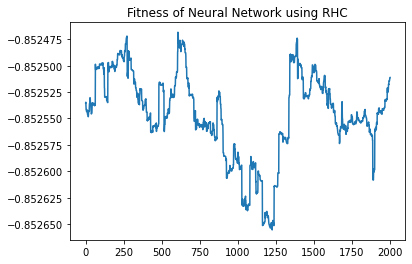

In [91]:
x = np.arange(1, 2001, 1)
y = nn_sa_1.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using SA")
plt.show()

schedule

In [170]:
schedules = [mlrose.GeomDecay(), mlrose.ArithDecay(), mlrose.ExpDecay()]

for sched in schedules:
    
    print("schedule:",sched)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'simulated_annealing', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = 0.0001,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    schedule = sched )

    nn.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

schedule: <mlrose.decay.GeomDecay object at 0x7f87f368f810>
Polling, Train F1 Score:  0.3969516235917827

Polling, Test F1 Scores:  0.3876337693222354
schedule: <mlrose.decay.ArithDecay object at 0x7f87f305da50>
Polling, Train F1 Score:  0.3969516235917827

Polling, Test F1 Scores:  0.3876337693222354
schedule: <mlrose.decay.ExpDecay object at 0x7f87f36a5fd0>
Polling, Train F1 Score:  0.3969516235917827

Polling, Test F1 Scores:  0.3876337693222354


learning_rate

In [171]:
learning_rate = [0.0001, 0.001, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

for num in learning_rate:
    
    print("learning rate:",num)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'simulated_annealing', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = num,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    schedule = mlrose.GeomDecay())

    nn.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

learning rate: 0.0001
Polling, Train F1 Score:  0.3969516235917827

Polling, Test F1 Scores:  0.3876337693222354
learning rate: 0.001
Polling, Train F1 Score:  0.39741679085941384

Polling, Test F1 Scores:  0.3869944488501189
learning rate: 0.01
Polling, Train F1 Score:  0.40309058030577016

Polling, Test F1 Scores:  0.3943329397874853
learning rate: 0.05
Polling, Train F1 Score:  0.44134253450439154

Polling, Test F1 Scores:  0.43452380952380953
learning rate: 0.1
Polling, Train F1 Score:  0.4857438321760969

Polling, Test F1 Scores:  0.4898813677599442
learning rate: 0.25
Polling, Train F1 Score:  0.5894601542416452

Polling, Test F1 Scores:  0.5959504381988516
learning rate: 0.5
Polling, Train F1 Score:  0.6454384634824362

Polling, Test F1 Scores:  0.6527071492671254


##### Genetic Algorithm

In [172]:
nn_ga_1 = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                algorithm = 'genetic_alg', max_iters=2000,
                                bias = True, is_classifier=True, learning_rate = 0.0001,
                                early_stopping = True, clip_max = 5, max_attempts = 100,
                                random_state = 42, curve = True,
                                pop_size = 200, mutation_prob = 0.2)

nn_ga_1.fit(X_Train_Polling, Y_Train_Polling)

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

NeuralNetwork(clip_max=5, early_stopping=True, hidden_nodes=[156],
              learning_rate=0.0001, max_iters=2000, mutation_prob=0.2)

In [173]:
# predict labels for Training Set 
Y_Train_Pred = nn_ga_1.predict(X_Train_Polling)

Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)

print("Polling, Train F1 Score: ", Y_Train_F1_Score)

#predict labels for Testing Set 
Y_Test_Pred = nn_ga_1.predict(X_Test_Polling)

Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)

print()
print("Polling, Test F1 Scores: ", Y_Test_F1_Score)

Polling, Train F1 Score:  0.8108176100628931

Polling, Test F1 Scores:  0.8111638954869358


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))


In [174]:
len(nn_ga_1.fitness_curve)

104

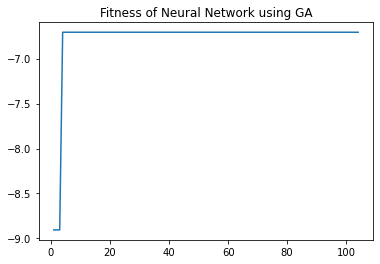

In [177]:
x = np.arange(1, len(nn_ga_1.fitness_curve)+1, 1)
y = nn_ga_1.fitness_curve

plt.plot(x, y)
plt.title("Fitness of Neural Network using GA")
plt.show()

In [ ]:
#nn_ga_1.fitted_weights

#nn_ga_1.loss

#nn_ga_1.predicted_probs

#nn_ga_1.fitness_curve

pop_size

In [178]:
pop_size_list = [.10, .25, .50, .75, 1.0, 1.50, 2.0, 2.50, 3.0, 5.0]
problem_length = len(X_Train)

for num in pop_size_list:
    
    size = problem_length * num
    
    print("pop_size:",size)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'genetic_alg', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = 0.0001,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    pop_size = size, mutation_prob = 0.2)

    nn.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

pop_size: 12.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

Polling, Train F1 Score:  0.8232804232804233

Polling, Test F1 Scores:  0.8214676889375685
pop_size: 30.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

Polling, Train F1 Score:  0.8613960470352765

Polling, Test F1 Scores:  0.8592375366568915
pop_size: 60.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

Polling, Train F1 Score:  0.7935377875136912

Polling, Test F1 Scores:  0.8001271051795359
pop_size: 90.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

Polling, Train F1 Score:  0.7949561403508771

Polling, Test F1 Scores:  0.801658163265306
pop_size: 120.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

Polling, Train F1 Score:  0.8156872268091305

Polling, Test F1 Scores:  0.8193657984144961
pop_size: 180.0


/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77: RuntimeWarning: overflow encountered in exp
  fx = 1/(1 + np.exp(-x))
/Users/amandahutter/anaconda3/lib/python3.7/site-packages/mlrose/activation.py:77:

KeyboardInterrupt: 

mutation_prob

In [182]:
mutation_prob_list = np.arange(0.1, 1, 0.1) 

for num in mutation_prob_list:
    
    print("mutation_prob:",num)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'genetic_alg', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = 0.0001,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    pop_size = 200, mutation_prob = num)

    nn.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

mutation_prob: 0.1


KeyboardInterrupt: 

learning_rate

In [ ]:
learning_rate = [0.0001, 0.001, 0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

for num in learning_rate:
    
    print("learning rate:",num)
    nn = mlrose.NeuralNetwork(hidden_nodes = [156], activation = 'identity',
                                    algorithm = 'genetic_alg', max_iters=2000,
                                    bias = True, is_classifier=True, learning_rate = num,
                                    early_stopping = True, clip_max = 5, max_attempts = 100,
                                    random_state = 42, curve = True,
                                    pop_size = 200, mutation_prob = .2)

    nn.fit(X_Train_Polling, Y_Train_Polling)
    
    # predict labels for Training Set 
    Y_Train_Pred = nn.predict(X_Train_Polling)
    Y_Train_F1_Score = f1_score(Y_Train_Polling, Y_Train_Pred)
    print("Polling, Train F1 Score: ", Y_Train_F1_Score)

    #predict labels for Testing Set 
    Y_Test_Pred = nn.predict(X_Test_Polling)
    Y_Test_F1_Score = f1_score(Y_Test_Polling, Y_Test_Pred)
    print()
    print("Polling, Test F1 Scores: ", Y_Test_F1_Score)
    

learning rate: 0.0001
Polling, Train F1 Score:  0.8108176100628931

Polling, Test F1 Scores:  0.8111638954869358
learning rate: 0.001
Polling, Train F1 Score:  0.8108176100628931

Polling, Test F1 Scores:  0.8111638954869358
learning rate: 0.01
Polling, Train F1 Score:  0.8108176100628931

Polling, Test F1 Scores:  0.8111638954869358
learning rate: 0.05
